In [1]:
from kaggle_handler import handler
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')

In [2]:
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA

# Feature Engineering
- **Feature Extraction**
  - Principle Componend Analysis (PCA)

        It use to reduce the curse of dimenselaty which help in faster execution of the algorithum. It also make heigh dementional data visible

# Loading / Downloading Dataset

In [3]:
Assets = handler('oddrationale/mnist-in-csv')

Directory 'Assets' already exists.
Datasets already exist in Assets folder
['mnist_train.csv', 'lung_cancer_prediction_dataset.csv', 'Titanic-Dataset.csv', 'GenZ_DatingApp_Data.csv', 'concrete_data.csv', 'mnist_test.csv']
 Change Add_more parameter to download more datasets


In [4]:
Assets

['mnist_train.csv',
 'lung_cancer_prediction_dataset.csv',
 'Titanic-Dataset.csv',
 'GenZ_DatingApp_Data.csv',
 'concrete_data.csv',
 'mnist_test.csv']

In [5]:
train = pd.read_csv('Assets/mnist_train.csv')
test = pd.read_csv('Assets/mnist_test.csv')

# Spliting Dataset

In [6]:
X_train, y_train = train.iloc[:,1:]/255,train.iloc[:,0]
X_test, y_test = test.iloc[:,1:]/255,test.iloc[:,0]

In [7]:
y_train.unique()

array([5, 0, 4, 1, 9, 2, 3, 6, 7, 8])

# Image data visualization

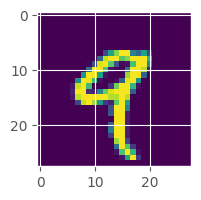

In [8]:
plt.figure(figsize=(2,2))
plt.imshow(np.array(X_train.iloc[4]).reshape(28,28))
plt.show()

# Modling and Treaning Data With All Dimentions/Columns

In [9]:
KNC = KNeighborsClassifier()

KNC_model = KNC.fit(X_train,y_train)

In [10]:
y_pred = KNC.predict(X_test)

# Accuracy Score with all Dimentions

In [11]:
accuracy_score(y_pred=y_pred,y_true=y_test)

0.9688

# Principle Componend Analysis

In [12]:
pca = PCA(n_components=None)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [13]:
pca.components_.shape

(784, 784)

In [14]:
pca.explained_variance_.shape

(784,)

In [15]:
pca.explained_variance_ratio_.shape

(784,)

# n_components selection using graph

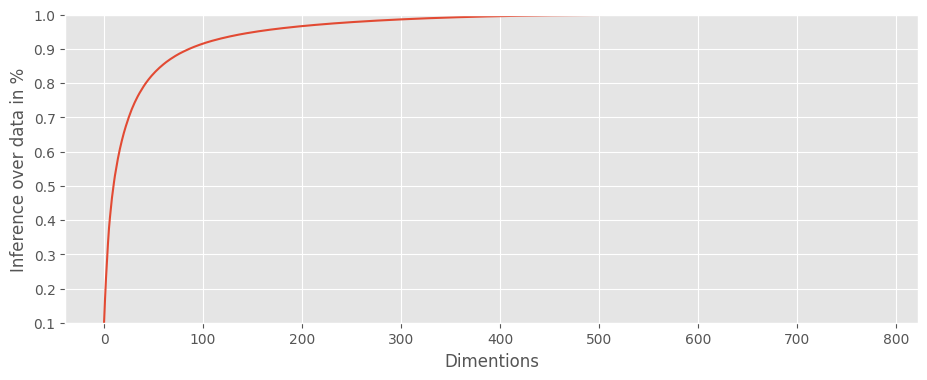

In [16]:
cum_percent_sum = np.cumsum(pca.explained_variance_ratio_)
plt.figure(figsize=(11,4))
plt.plot(cum_percent_sum)
plt.xlabel("Dimentions")
plt.ylabel("Inference over data in %")
plt.ylim([.1,1])
plt.show()

# Modeling and Treaning Data on Selected Components

In [17]:
pca = PCA(n_components=100)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [18]:
KNC = KNeighborsClassifier()

KNC_model = KNC.fit(X_train_pca,y_train)

In [19]:
y_pred = KNC.predict(X_test_pca)

# Accuracy with PCA Transformed Data

In [20]:
accuracy_score(y_pred=y_pred,y_true=y_test)

0.9727

# Reducing And Ploting Data in 2D

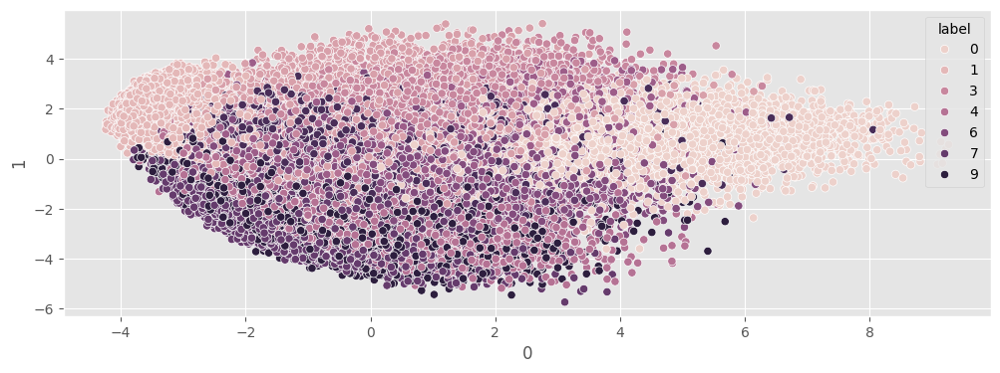

In [21]:
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

data = pd.concat([pd.DataFrame(X_train_pca),pd.DataFrame(y_train)], axis=1)

plt.figure(figsize=(12,4))
sns.scatterplot(data=data,x=0,y=1,hue='label')
plt.show()

# Reducing And Ploting Data in 3D

In [22]:
pca = PCA(n_components=3)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [23]:
X_train_pca.shape, y_train.shape
data = pd.concat([pd.DataFrame(X_train_pca),pd.DataFrame(y_train)], axis=1)
data.shape, data.columns

((60000, 4), Index([0, 1, 2, 'label'], dtype='object'))

In [24]:
import plotly.express as px
fig = px.scatter_3d(data, x=0, y=1, z=2,
              color='label')
fig.show()